In [95]:
import pandas as pd
temp_frame1=pd.read_csv(r"./temp_frame1.csv")

In [96]:
temp_frame1

,news_type,industry,product,provider,provider_location,buyer_location,bill,行业,buyer,category
0,第一类新闻,风能,空,金盘科技,中游,下游,1.5亿元。,Industry: Energy.,甘肃瓜州宝丰风能开发有限公司,Energy
1,第一类新闻,CDMO,空,普洛药业,下游,上游,空。,Industry: HealthCare,江苏先声药业有限公司,HealthCare
2,第一类新闻,建筑材料,熔岩管,空,空,中游,空,Industry: Materials,北京空间机电研究所,Materials
3,第一类新闻,燃气和风力涡轮机,空,通用电气,下游,中游,空,Industry: Energy.,GE Vernova,Energy
4,第一类新闻,汽车电子产品,空,生益电子,中游,下游,空。,Industry: Industrials,多家客户,Industrials
...,...,...,...,...,...,...,...,...,...,...
1841,第一类新闻,航运,空,钦州港,上游,下游,空,Industry: Industrials,北部湾港,Industrials
1842,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",空,Industry: Industrials,某知名海工模块企业,Industrials
1843,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",空,Industry: Industrials,船舶制造企业,Industrials
1844,第一类新闻,生物科技,多肽合成,楚天科技,"上游,,,下游",空,空。,Industry: Healthcare.,楚天派特,HealthCare


In [97]:
#去掉空值和'T'
temp_frame1 = temp_frame1.dropna()
temp_frame1=temp_frame1[temp_frame1["buyer"]!='T']
temp_frame1

,news_type,industry,product,provider,provider_location,buyer_location,bill,行业,buyer,category
0,第一类新闻,风能,空,金盘科技,中游,下游,1.5亿元。,Industry: Energy.,甘肃瓜州宝丰风能开发有限公司,Energy
1,第一类新闻,CDMO,空,普洛药业,下游,上游,空。,Industry: HealthCare,江苏先声药业有限公司,HealthCare
2,第一类新闻,建筑材料,熔岩管,空,空,中游,空,Industry: Materials,北京空间机电研究所,Materials
3,第一类新闻,燃气和风力涡轮机,空,通用电气,下游,中游,空,Industry: Energy.,GE Vernova,Energy
4,第一类新闻,汽车电子产品,空,生益电子,中游,下游,空。,Industry: Industrials,多家客户,Industrials
...,...,...,...,...,...,...,...,...,...,...
1841,第一类新闻,航运,空,钦州港,上游,下游,空,Industry: Industrials,北部湾港,Industrials
1842,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",空,Industry: Industrials,某知名海工模块企业,Industrials
1843,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",空,Industry: Industrials,船舶制造企业,Industrials
1844,第一类新闻,生物科技,多肽合成,楚天科技,"上游,,,下游",空,空。,Industry: Healthcare.,楚天派特,HealthCare


In [98]:
temp_frame1['provider'] = temp_frame1['provider'].str.replace('中游', '')
temp_frame1['provider'] = temp_frame1['provider'].str.replace('下游', '')
temp_frame1['provider'] = temp_frame1['provider'].str.replace('上游', '')
temp_frame1['buyer'] = temp_frame1['buyer'].str.replace('中游', '')
temp_frame1['buyer'] = temp_frame1['buyer'].str.replace('下游', '')
temp_frame1['buyer'] = temp_frame1['buyer'].str.replace('上游', '')

In [99]:
temp_frame1

,news_type,industry,product,provider,provider_location,buyer_location,bill,行业,buyer,category
0,第一类新闻,风能,空,金盘科技,中游,下游,1.5亿元。,Industry: Energy.,甘肃瓜州宝丰风能开发有限公司,Energy
1,第一类新闻,CDMO,空,普洛药业,下游,上游,空。,Industry: HealthCare,江苏先声药业有限公司,HealthCare
2,第一类新闻,建筑材料,熔岩管,空,空,中游,空,Industry: Materials,北京空间机电研究所,Materials
3,第一类新闻,燃气和风力涡轮机,空,通用电气,下游,中游,空,Industry: Energy.,GE Vernova,Energy
4,第一类新闻,汽车电子产品,空,生益电子,中游,下游,空。,Industry: Industrials,多家客户,Industrials
...,...,...,...,...,...,...,...,...,...,...
1841,第一类新闻,航运,空,钦州港,上游,下游,空,Industry: Industrials,北部湾港,Industrials
1842,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",空,Industry: Industrials,某知名海工模块企业,Industrials
1843,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",空,Industry: Industrials,船舶制造企业,Industrials
1844,第一类新闻,生物科技,多肽合成,楚天科技,"上游,,,下游",空,空。,Industry: Healthcare.,楚天派特,HealthCare


In [149]:
category=temp_frame1["category"].unique().tolist()

In [104]:
temp_frame1.to_csv(r"./temp_frame2",index=False,encoding="utf_8_sig")

In [ ]:
#algorithm 2, a little slower
import networkx as nx
from fuzzywuzzy import fuzz
import pandas as pd
def merge_companies(df, threshold=80):
    # 创建无向图
    graph = nx.Graph()
    # 添加所有公司到图中
    all_companies = set(df['provider']) | set(df['buyer'])
    try:
        all_companies.remove('空')
    except KeyError:
        print("no need to delete")
        
    for company in all_companies:
        graph.add_node(company)
    # 构建边的连接关系
    for company1 in all_companies:
        for company2 in all_companies:
            if company1 != company2:
                similarity = fuzz.partial_ratio(company1, company2)
                if similarity > threshold:
                    graph.add_edge(company1, company2)

    # 获取图中的强连通分量
    connected_components = nx.connected_components(graph)

    # 生成公司名称合并字典
    merged_names = {}
    for component in connected_components:
        shortest_name = min(component, key=len)
        for name in component:
            merged_names[name] = shortest_name

    # 更新DataFrame中的公司名称
    df['provider'] = df['provider'].map(merged_names)
    df['buyer'] = df['buyer'].map(merged_names)

    return df, merged_names

# 示例使用
data = {
    'provider': ['华为技术有限公司', '华为信息技术有限公司', '华为', '小米科技有限公司'],
    'buyer': ['华为', '华为通信有限公司', 'Xiaomi', '小米']
}

df = pd.DataFrame(data)
merged_df, merged_names = merge_companies(df, threshold=80)
print(merged_df)
print(merged_names)

In [105]:
#因为一些公司有不同的名称，类似'华为'和'华为技术公司',这里使用fuzz.partial_ratio判断字符串的部分相似度
#使用图结构中强连通分量中最短的名称作为公司名称
#algorithm1
import networkx as nx
from fuzzywuzzy import fuzz
import pandas as pd

def merge_companies(df, threshold=80):
    # 创建无向图
    graph = nx.Graph()
    # 创建公司列表
    company_list = set(df["buyer"].tolist() + df["provider"].tolist())
    try:
        company_list.remove('空')
    except KeyError:
        print("no need to delete")
    # 添加所有公司到图中
    for company in company_list:
        nodes = graph.nodes()
        if company not in nodes:
            flag=0
            # 检查是否有相似度高的元素
            node_list=[]
            for node in nodes:
                similarity = fuzz.partial_ratio(node, company)
                if similarity > threshold:
                    flag=1
                    node_list.append(node)
            if flag==1:
                for node in node_list:
                    graph.add_edge(company, node)
                    graph.add_edge(node, company)
            if flag == 0:
                graph.add_node(company)

    # 获取图中的强连通分量
    connected_components = nx.connected_components(graph)
     # 生成公司名称合并字典
    merged_names = {}
    for component in connected_components:
        print("one component")
        shortest_name = min(component, key=len)
        print("shortest_name in component:",shortest_name)
        for name in component:
            #print("component name",name)
            merged_names[name] = shortest_name
    #将孤立顶点加到merged_names中
    isolates = nx.isolates(graph)
    for isolate in isolates:
        merged_names[isolate] = isolate
    
    return merged_names

# 示例使用
data = {
    'provider': ['华为技术有限公司', '华为信息技术有限公司', '华为', '小米科技有限公司'],
    'buyer': ['华为', '华为通信有限公司', 'Xiaomi', '小米']
}

df = pd.DataFrame(data)
merged_names = merge_companies(df, threshold=80)

no need to delete
one component
shortest_name in component: 华为
component name 华为技术有限公司
component name 华为通信有限公司
component name 华为
component name 华为信息技术有限公司
one component
shortest_name in component: 小米
component name 小米
component name 小米科技有限公司
one component
shortest_name in component: Xiaomi
component name Xiaomi


In [115]:
temp_frame1=pd.read_csv(r"./temp_frame2")
temp_frame1

,news_type,industry,product,provider,provider_location,buyer_location,bill,行业,buyer,category
0,第一类新闻,风能,空,金盘科技,中游,下游,1.5亿元。,Industry: Energy.,甘肃瓜州宝丰风能开发有限公司,Energy
1,第一类新闻,CDMO,空,普洛药业,下游,上游,空。,Industry: HealthCare,江苏先声药业有限公司,HealthCare
2,第一类新闻,建筑材料,熔岩管,空,空,中游,空,Industry: Materials,北京空间机电研究所,Materials
3,第一类新闻,燃气和风力涡轮机,空,通用电气,下游,中游,空,Industry: Energy.,GE Vernova,Energy
4,第一类新闻,汽车电子产品,空,生益电子,中游,下游,空。,Industry: Industrials,多家客户,Industrials
...,...,...,...,...,...,...,...,...,...,...
1822,第一类新闻,航运,空,钦州港,上游,下游,空,Industry: Industrials,北部湾港,Industrials
1823,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",空,Industry: Industrials,某知名海工模块企业,Industrials
1824,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",空,Industry: Industrials,船舶制造企业,Industrials
1825,第一类新闻,生物科技,多肽合成,楚天科技,"上游,,,下游",空,空。,Industry: Healthcare.,楚天派特,HealthCare


In [122]:
company_list = set(temp_frame1["buyer"].astype("str").tolist() + temp_frame1["provider"].astype("str").tolist())

True

In [123]:
company_list

{'广东长实通信科技有限公司',
 '昆山经济技术开发区管理委员会',
 '济民医疗',
 '百度',
 '奇瑞汽车股份有限公司',
 '小米手机',
 '用户',
 'KMSB Motors Sdn. Bhd公司',
 '精工钢构',
 '北美大客户FSD',
 '印度',
 '重庆迪康尔乐制药有限公司',
 '新疆银丰',
 '药石科技',
 '风华高科',
 '摩尔线程',
 '中国国家石油天然气管网集团有限公司',
 '国光电器',
 '鸿晟电力,,,鸿能电务,,,宁波碳银',
 '本公司',
 '头部消费品牌客户',
 '河北开放大学',
 '未来电器',
 '光峰科技',
 '中节能（漳州）',
 '智能驾驶、手机通信等领域的客户',
 'CFM国际公司',
 '电池防火材料加工厂家',
 '中国航天科技集团有限公司六院',
 '韩国国家石油公司',
 '宁德三都澳公司',
 'vivo',
 '奔驰',
 '海南自贸港',
 '上海地铁',
 '通威股份',
 '国电南自',
 '中化现代农业有限公司',
 '贝特瑞',
 '部分新能源汽车生产企业',
 '上汽集团',
 '因赛集团',
 '密封科技',
 '众多充电桩厂商',
 '科蓝软件系统股份有限公司',
 '长安福特,,,吉利汽车,,,比亚迪汽车,,,广汽乘用车,,,合众汽车',
 '意法半导体意大利业务',
 '小批量客户',
 '南京云开合金有限公司',
 '中电环保',
 '长远锂科',
 '隆基',
 '金盘科技',
 '三孚电子材料',
 '乐耕城开',
 '北京银行',
 '玲珑轮胎',
 '九龙县汤古电力开发有限公司',
 '东方电气集团',
 '剑桥科技',
 '超图软件集团',
 '百度网讯科技有限公司',
 '中国钢铁工业协会副会长骆铁军',
 '浙银金融租赁',
 '欧菲光',
 '通用',
 '黄湾镇政府',
 '宇环数控',
 '凌志软件',
 '广发银行',
 '比亚迪,吉利汽车',
 '迈为股份',
 '阿凡达新能源汽车',
 '飞荣达',
 '天宸股份',
 '君实生物',
 '北京昇科能源科技有限责任公司',
 '震有科技',
 '电科数字',
 'LG公司',
 '润建股份',
 '新的哈萨林2号运营商',
 '汽车线束厂商',
 '普华永道',
 '传奇生

In [124]:
company_list=sorted(company_list, key=len)
company_list

[',',
 '空',
 '百度',
 '用户',
 '印度',
 '奔驰',
 '隆基',
 '通用',
 '贝壳',
 '长安',
 '大众',
 '辉瑞',
 '，空',
 '捷佳',
 '福田',
 '旺旺',
 '罗森',
 '优步',
 '生产',
 '金融',
 '晶澳',
 '多点',
 '台郡',
 '瑞银',
 '五菱',
 '景硕',
 '联想',
 '长城',
 ',,',
 '淘宝',
 '荣耀',
 '高途',
 '黄海',
 '魅族',
 '万科',
 '中国',
 '客户',
 '上航',
 '尚德',
 '中交',
 '美的',
 '运输',
 '海拉',
 '高通',
 '宇通',
 '松下',
 '小派',
 '晶盛',
 '北汽',
 '高景',
 '沙特',
 '苹果',
 '蔚来',
 '本田',
 '三星',
 '奇瑞',
 '南电',
 '欣兴',
 '九号',
 '华为',
 '广汽',
 '全家',
 '加注',
 '小米',
 '京东',
 '福建',
 '纳德',
 '合众',
 '美团',
 '海信',
 '中免',
 '晶科',
 '台湾',
 '神通',
 '理想',
 '哪吒',
 '丰田',
 '华发',
 '零跑',
 '中兴',
 '采钰',
 '臻鼎',
 '大疆',
 '代理',
 '公司',
 '礼来',
 '鸿海',
 '和硕',
 '吉利',
 '小鹏',
 '万达',
 '江铃',
 '福特',
 '抖音',
 '同方',
 '快手',
 '一汽',
 '双良',
 '天合',
 '江淮',
 '推特',
 '字节',
 '金山',
 '认证',
 '政府',
 '上汽',
 '日产',
 '金龙',
 '宝马',
 '力拓',
 '问界',
 '宏碁',
 '华润',
 '东风',
 '东航',
 '腾讯',
 '雅安',
 '网易',
 '阿里',
 '有道',
 '嘉盛',
 '微软',
 '本公司',
 '贝特瑞',
 '欧菲光',
 '飞荣达',
 '凌云光',
 '英伟达',
 '英威腾',
 '英维克',
 '伊之密',
 '易事特',
 '东富龙',
 '汇创达',
 '中石油',
 '黎巴嫩',
 '力合微',
 '贝斯特',
 'ARM',
 '360',
 '保龄

In [140]:
#删掉的元素
elements_to_remove = [',', '空','用户','印度', '，空',',,','中国','客户','沙特', '加注','福建','代理', '公司', '本公司','nan','大客户','生产','金融','通用','福田','黄海','台湾','政府','客户端','不确定','子公司','供应商','该客户','大客户','咨询商','生产商','公安部','投资者','生产企业','供应商A','运输','整车厂',',,空,,空','主机厂','生产企业']

In [141]:
for element in elements_to_remove:
    temp_frame1= temp_frame1.replace(element, '')

In [142]:
company_list = set(temp_frame1["buyer"].astype("str").tolist() + temp_frame1["provider"].astype("str").tolist())
company_list.remove('')
sorted(company_list, key=len)

['百度',
 '奔驰',
 '隆基',
 '贝壳',
 '长安',
 '大众',
 '辉瑞',
 '捷佳',
 '旺旺',
 '罗森',
 '优步',
 '晶澳',
 '多点',
 '台郡',
 '瑞银',
 '五菱',
 '景硕',
 '联想',
 '长城',
 '淘宝',
 '荣耀',
 '高途',
 '魅族',
 '万科',
 '上航',
 '尚德',
 '中交',
 '美的',
 '海拉',
 '高通',
 '宇通',
 '松下',
 '小派',
 '晶盛',
 '北汽',
 '高景',
 '苹果',
 '蔚来',
 '本田',
 '三星',
 '奇瑞',
 '南电',
 '欣兴',
 '九号',
 '华为',
 '广汽',
 '全家',
 '小米',
 '京东',
 '纳德',
 '合众',
 '美团',
 '海信',
 '中免',
 '晶科',
 '神通',
 '理想',
 '哪吒',
 '丰田',
 '华发',
 '零跑',
 '中兴',
 '采钰',
 '臻鼎',
 '大疆',
 '礼来',
 '鸿海',
 '和硕',
 '吉利',
 '小鹏',
 '万达',
 '江铃',
 '福特',
 '抖音',
 '同方',
 '快手',
 '一汽',
 '双良',
 '天合',
 '江淮',
 '推特',
 '字节',
 '金山',
 '认证',
 '上汽',
 '日产',
 '金龙',
 '宝马',
 '力拓',
 '问界',
 '宏碁',
 '华润',
 '东风',
 '东航',
 '腾讯',
 '雅安',
 '网易',
 '阿里',
 '有道',
 '嘉盛',
 '微软',
 '贝特瑞',
 '欧菲光',
 '飞荣达',
 '凌云光',
 '英伟达',
 '英威腾',
 '英维克',
 '伊之密',
 '易事特',
 '东富龙',
 '汇创达',
 '中石油',
 '黎巴嫩',
 '力合微',
 '贝斯特',
 'ARM',
 '360',
 '保龄宝',
 '日月光',
 'WCO',
 '金力泰',
 '新北洋',
 '钦州港',
 '优刻得',
 'Arm',
 '斯巴鲁',
 '科博达',
 '中海达',
 '东方通',
 '宝兰德',
 'H公司',
 '星奕昂',
 '黄石厂',
 'B公司',
 'BMU',
 '飞利信',
 '西门子

In [143]:
graph = nx.Graph()
# 创建公司列表
# 添加所有公司到图中
for company in company_list:
    nodes = graph.nodes()
    if (company not in nodes)&(',' not in company)&('：' not in company)&(':' not in company):
        flag=0
        # 检查是否有相似度高的元素
        node_list=[]
        for node in nodes:
            similarity = fuzz.partial_ratio(node, company)
            if similarity > 90:
                flag=1
                #print("node:",node,"company:",company)
                node_list.append(node)
        if flag==1:
            for node in node_list:
                graph.add_edge(company, node)
                graph.add_edge(node, company)
        if flag == 0:
            graph.add_node(company)

# 获取图中的强连通分量
connected_components = nx.connected_components(graph)
 # 生成公司名称合并字典
merged_names = {}
for component in connected_components:
    print("connected_components group:")
    shortest_name = min(component, key=len)
    print("shortest_name in component is:",shortest_name,"|||")
    for name in component:
        print("component name",name)
        merged_names[name] = shortest_name

connected_components group:
shortest_name in component is: 长实通信 |||
component name 长实通信
component name 广东长实通信科技有限公司
connected_components group:
shortest_name in component is: 昆山经济技术开发区管理委员会 |||
component name 昆山经济技术开发区管理委员会
connected_components group:
shortest_name in component is: 济民医疗 |||
component name 济民医疗
connected_components group:
shortest_name in component is: 百度 |||
component name 百度
component name 百度公司
component name 百度智能云
component name 百度文心一言
component name 百度网讯科技有限公司
component name 百度Apollo
connected_components group:
shortest_name in component is: 奇瑞 |||
component name 奇瑞公司
component name 奇瑞汽车股份有限公司
component name 奇瑞
component name 奇瑞汽车
component name 奇瑞新能源
connected_components group:
shortest_name in component is: 小米 |||
component name 小米及其代工厂
component name 小米集团
component name 小米手机
component name 小米供应链
component name 小米公司
component name 小米
component name 小米汽车
connected_components group:
shortest_name in component is: KMSB Motors Sdn. Bhd公司 |||
component name KMSB Motors

In [144]:
merged_names

{'长实通信': '长实通信',
 '广东长实通信科技有限公司': '长实通信',
 '昆山经济技术开发区管理委员会': '昆山经济技术开发区管理委员会',
 '济民医疗': '济民医疗',
 '百度': '百度',
 '百度公司': '百度',
 '百度智能云': '百度',
 '百度文心一言': '百度',
 '百度网讯科技有限公司': '百度',
 '百度Apollo': '百度',
 '奇瑞公司': '奇瑞',
 '奇瑞汽车股份有限公司': '奇瑞',
 '奇瑞': '奇瑞',
 '奇瑞汽车': '奇瑞',
 '奇瑞新能源': '奇瑞',
 '小米及其代工厂': '小米',
 '小米集团': '小米',
 '小米手机': '小米',
 '小米供应链': '小米',
 '小米公司': '小米',
 '小米': '小米',
 '小米汽车': '小米',
 'KMSB Motors Sdn. Bhd公司': 'KMSB Motors Sdn. Bhd公司',
 '精工钢构': '精工钢构',
 '北美大客户FSD': '北美大客户',
 '北美大客户': '北美大客户',
 '重庆迪康尔乐制药有限公司': '重庆迪康尔乐制药有限公司',
 '新疆银丰': '新疆银丰',
 '药石科技': '药石科技',
 '风华高科': '风华高科',
 '摩尔线程': '摩尔线程',
 '摩尔线程智能科技（北京）有限责任公司': '摩尔线程',
 '中国国家石油天然气管网集团有限公司': '中国国家石油天然气管网集团有限公司',
 '国光电器': '国光电器',
 '头部消费品牌客户': '头部消费品牌客户',
 '河北开放大学': '河北开放大学',
 '未来电器': '未来电器',
 '光峰科技': '光峰科技',
 '中节能（漳州）': '中节能（漳州）',
 '智能驾驶、手机通信等领域的客户': '智能驾驶、手机通信等领域的客户',
 'CFM国际公司': 'CFM国际公司',
 '电池防火材料加工厂家': '电池防火材料加工厂家',
 '中国航天科技集团有限公司六院': '中国航天科技集团有限公司六院',
 '韩国国家石油公司': '韩国国家石油公司',
 '宁德三都澳公司': '宁德三都澳公司',
 'vivo': 'vivo',
 '北京奔驰汽车有限公司': '奔

In [145]:
#替换公司名称
merged_supply_chain_frame=temp_frame1.replace(merged_names)

In [146]:
merged_supply_chain_frame

,news_type,industry,product,provider,provider_location,buyer_location,bill,行业,buyer,category
0,第一类新闻,风能,,金盘科技,中游,下游,1.5亿元。,Industry: Energy.,甘肃瓜州宝丰风能开发有限公司,Energy
1,第一类新闻,CDMO,,普洛药业,下游,上游,空。,Industry: HealthCare,江苏先声药业有限公司,HealthCare
2,第一类新闻,建筑材料,熔岩管,,,中游,,Industry: Materials,北京空间机电研究所,Materials
3,第一类新闻,燃气和风力涡轮机,,通用电气,下游,中游,,Industry: Energy.,GE Vernova,Energy
4,第一类新闻,汽车电子产品,,生益电子,中游,下游,空。,Industry: Industrials,多家客户,Industrials
...,...,...,...,...,...,...,...,...,...,...
1822,第一类新闻,航运,,钦州港,上游,下游,,Industry: Industrials,北部湾港,Industrials
1823,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",,Industry: Industrials,某知名海工模块企业,Industrials
1824,第一类新闻,门式起重机,GENMA,润邦重机,"上游,,,上游","上游,,,中游",,Industry: Industrials,船舶制造企业,Industrials
1825,第一类新闻,生物科技,多肽合成,楚天科技,"上游,,,下游",,空。,Industry: Healthcare.,楚天派特,HealthCare


In [147]:
merged_supply_chain_frame.to_csv(r"./merged_supply_chain_frame.csv",index=False,encoding="utf_8_sig")

### 分析每个行业的graph，最大出度，最大入度，平均出度，平均入度，最长供应链，最大出度公司，最大入度公司

Energy


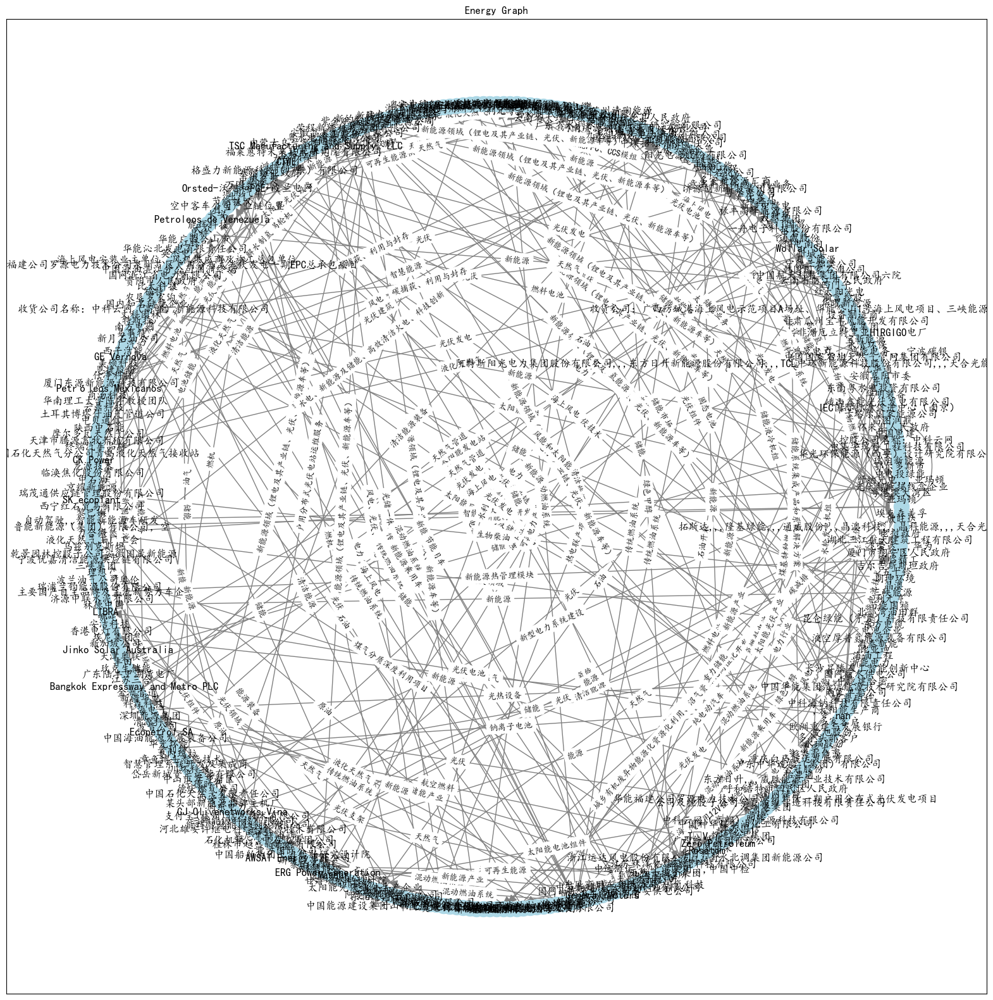

HealthCare


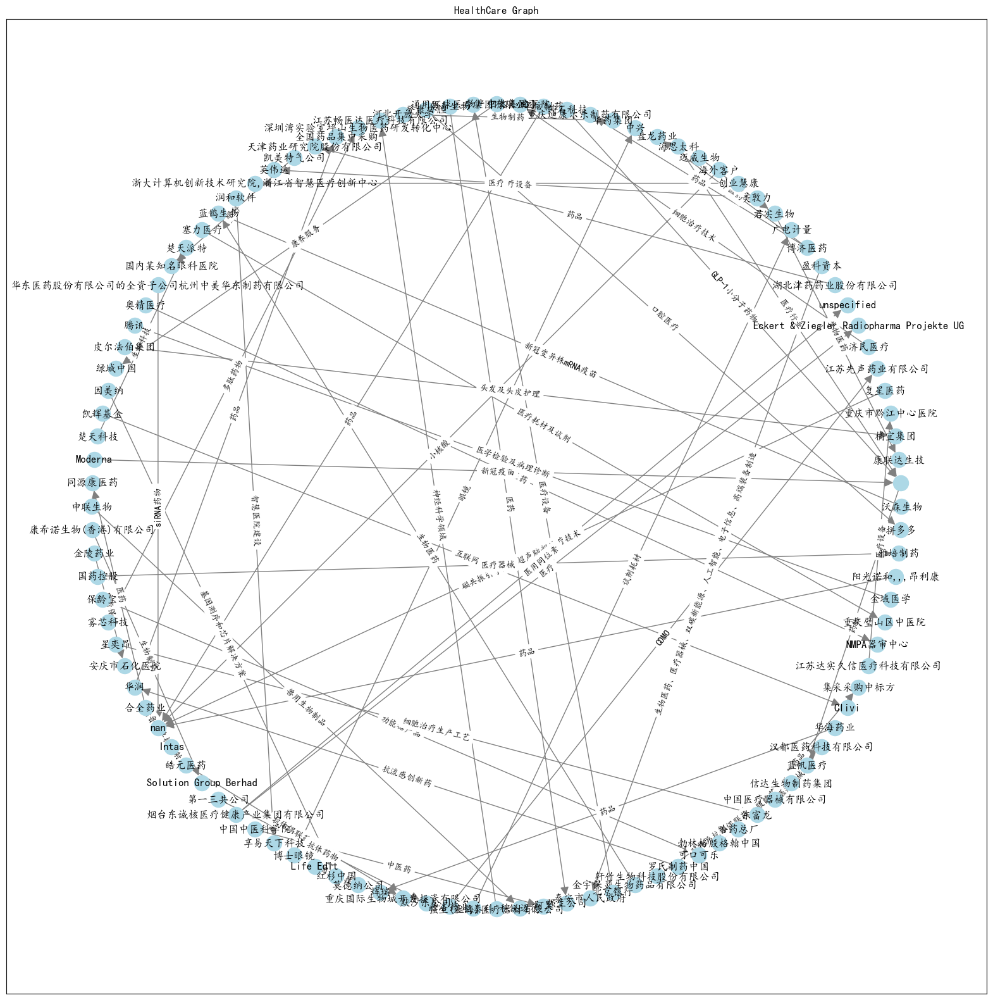

Materials


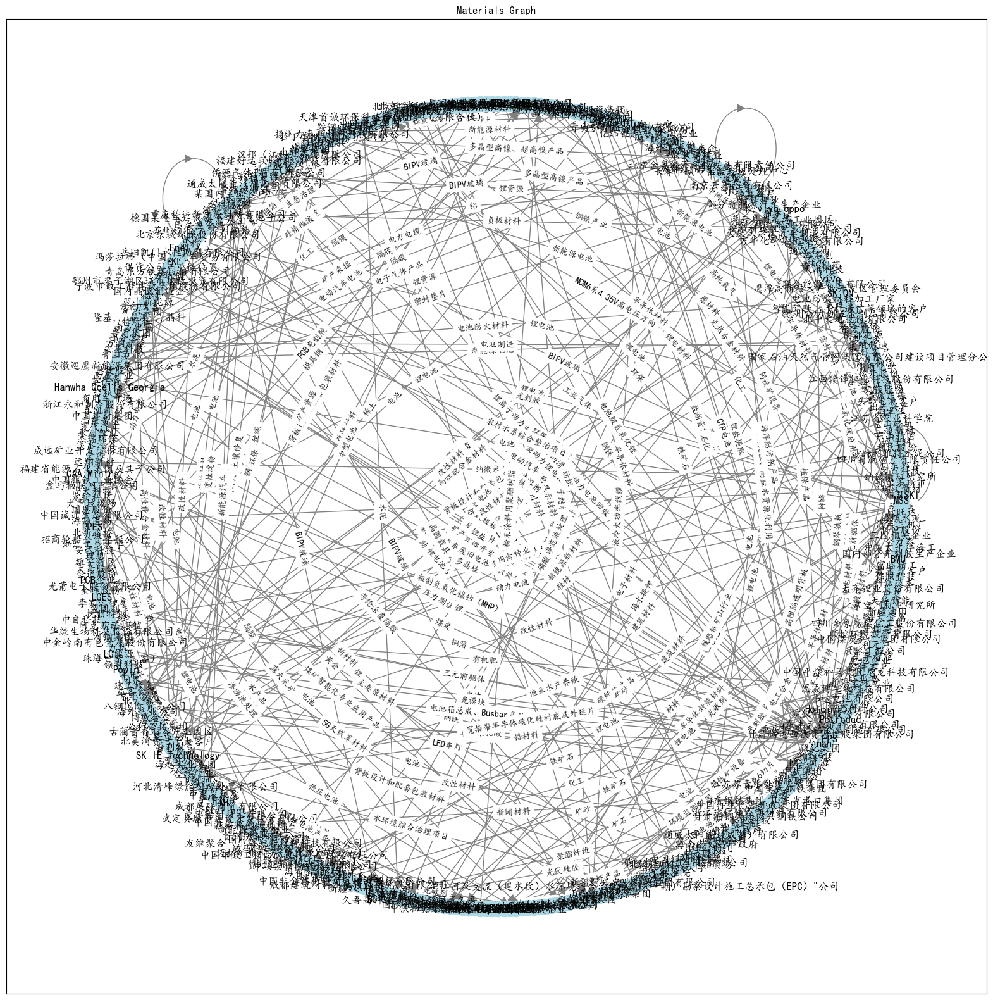

Industrials


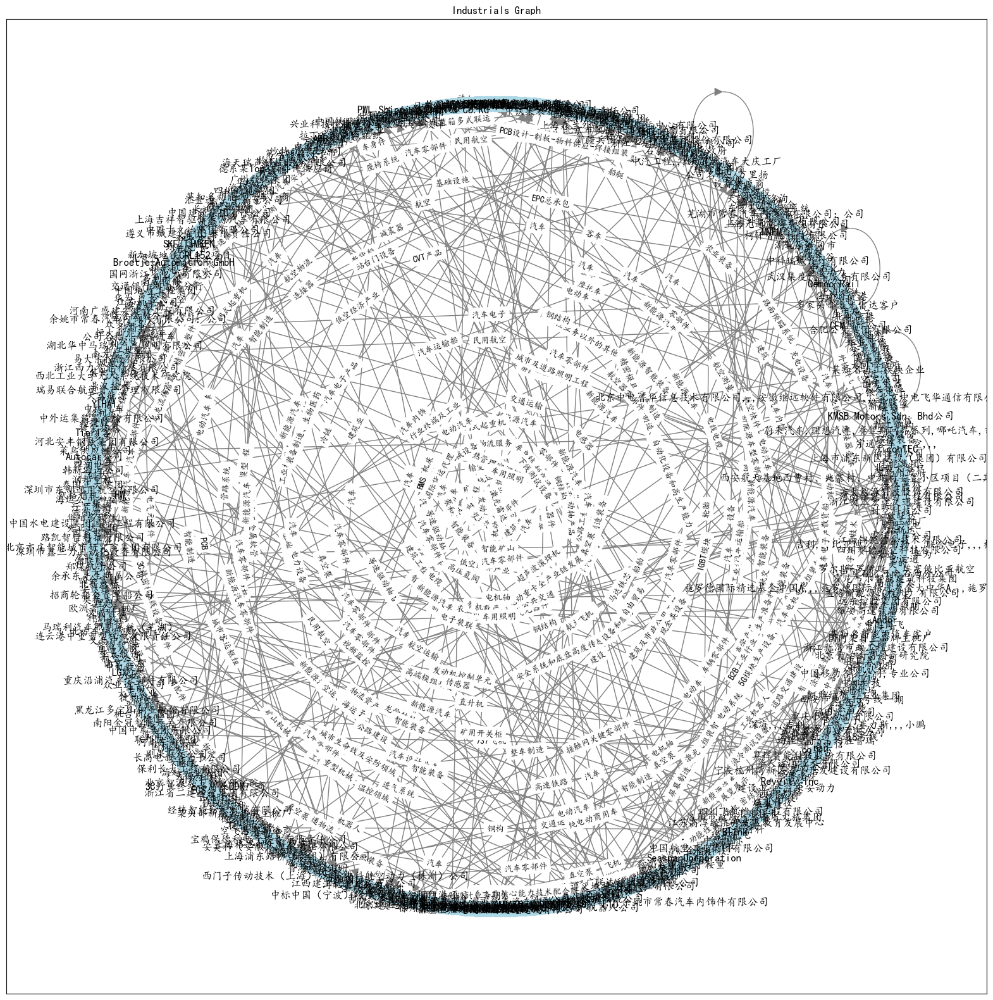

IT


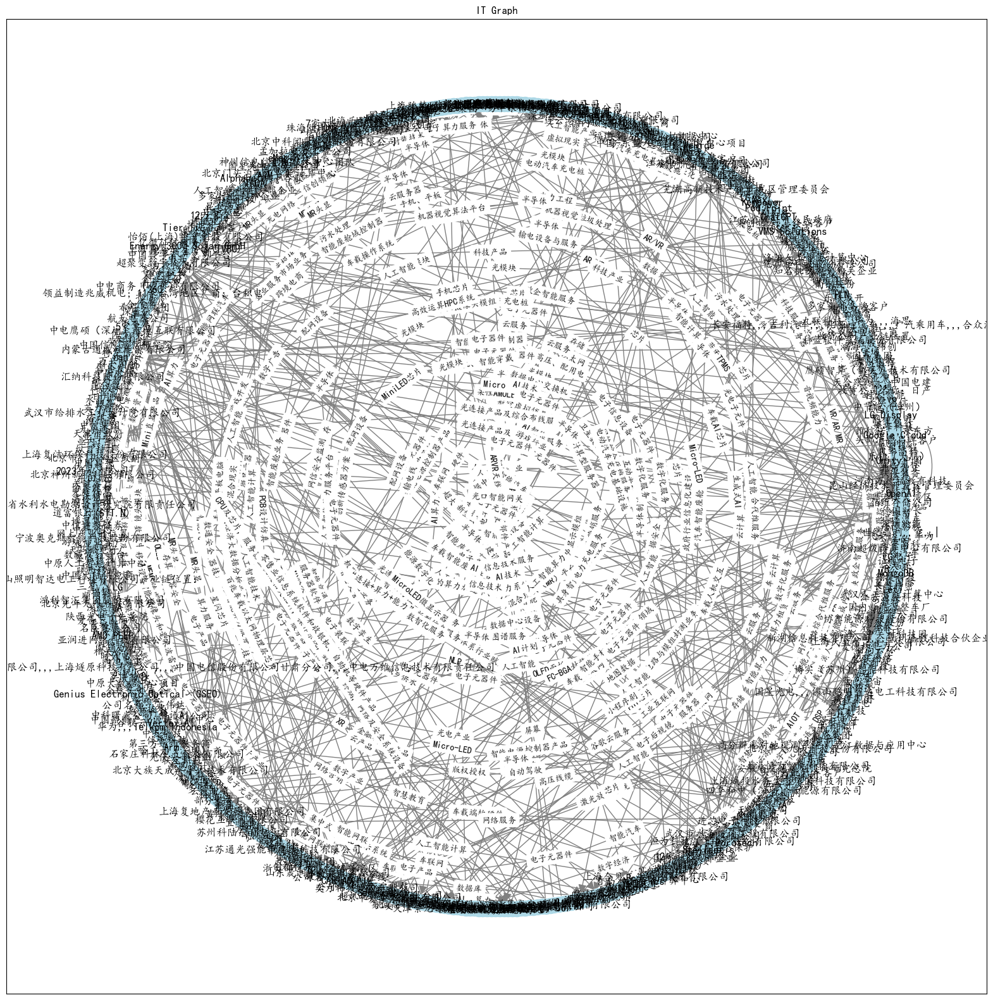

CD


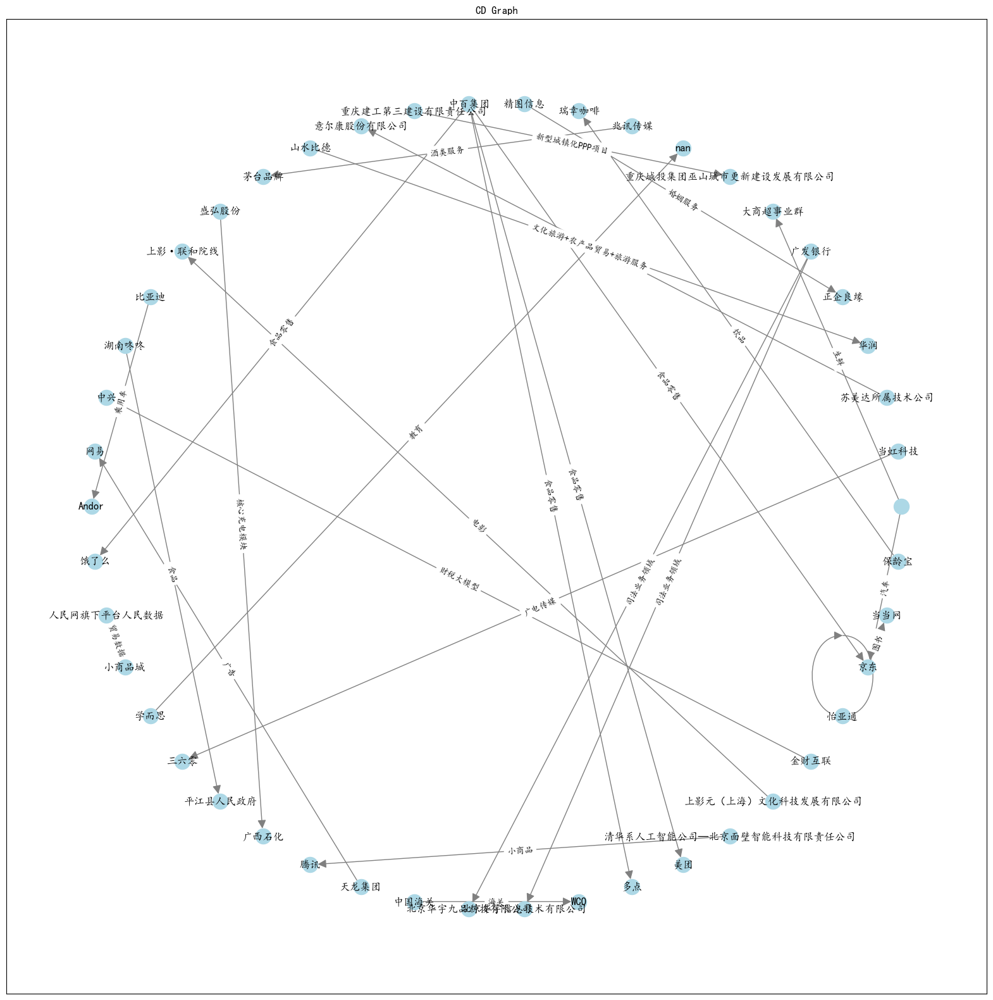

Financials


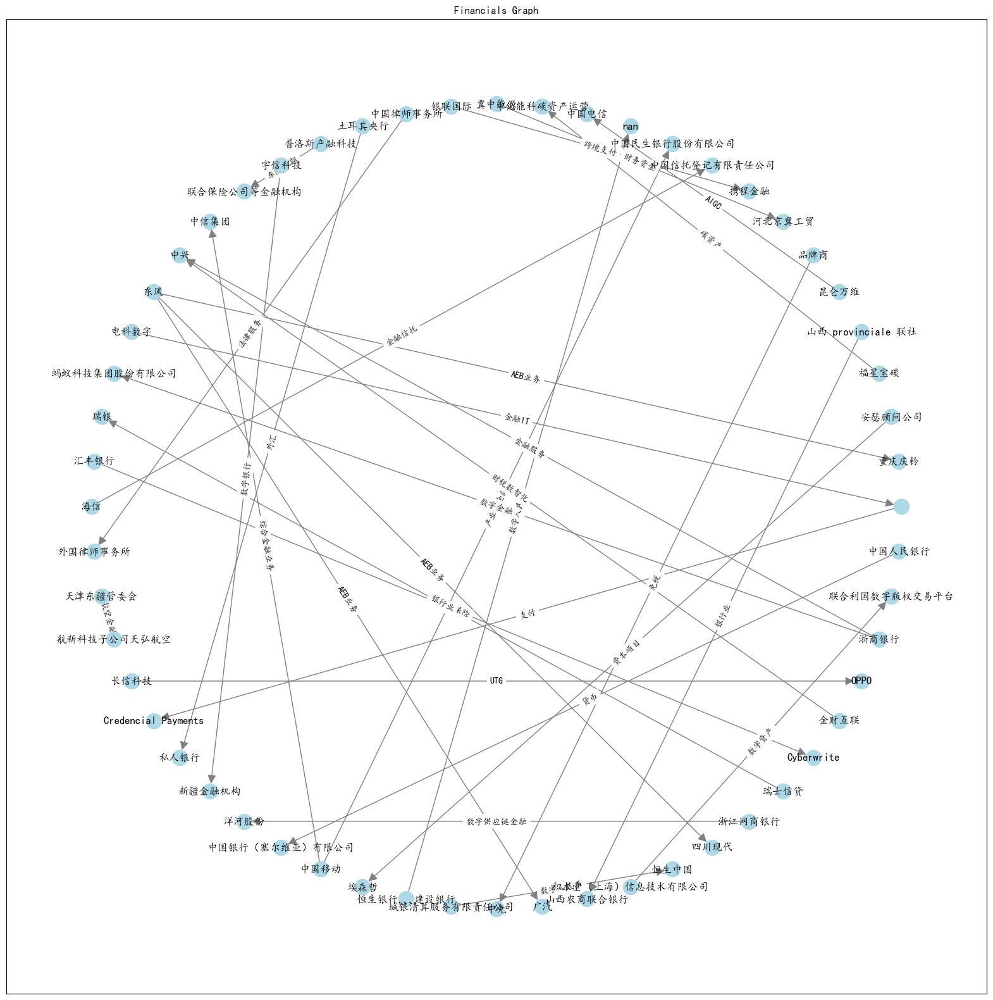

Telecom


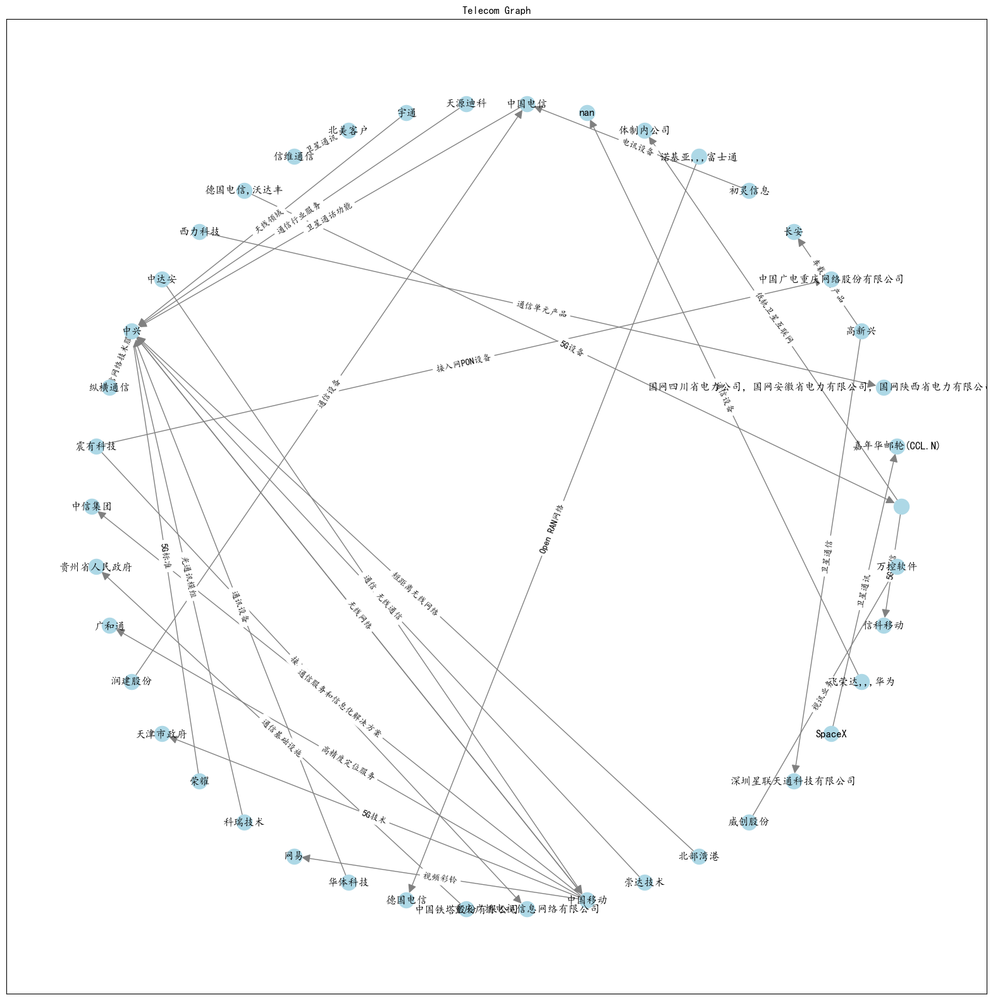

Unknown


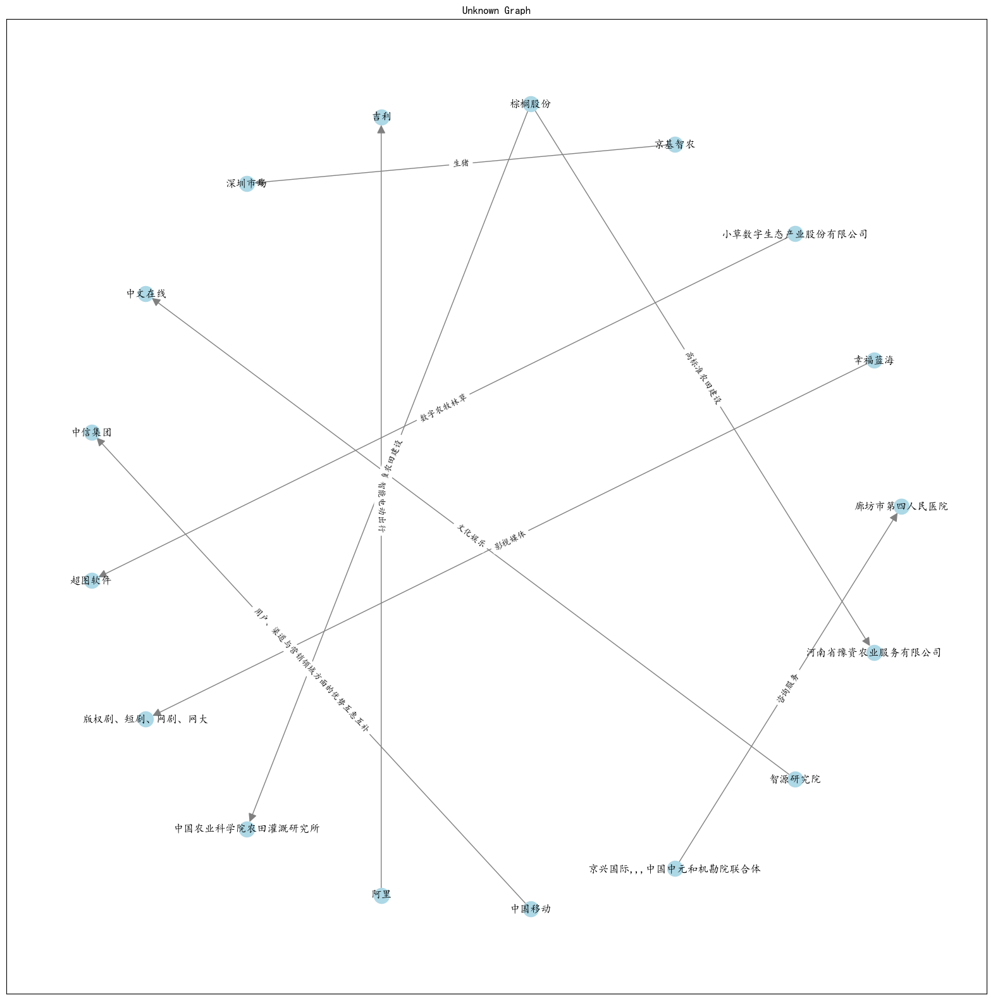

CS


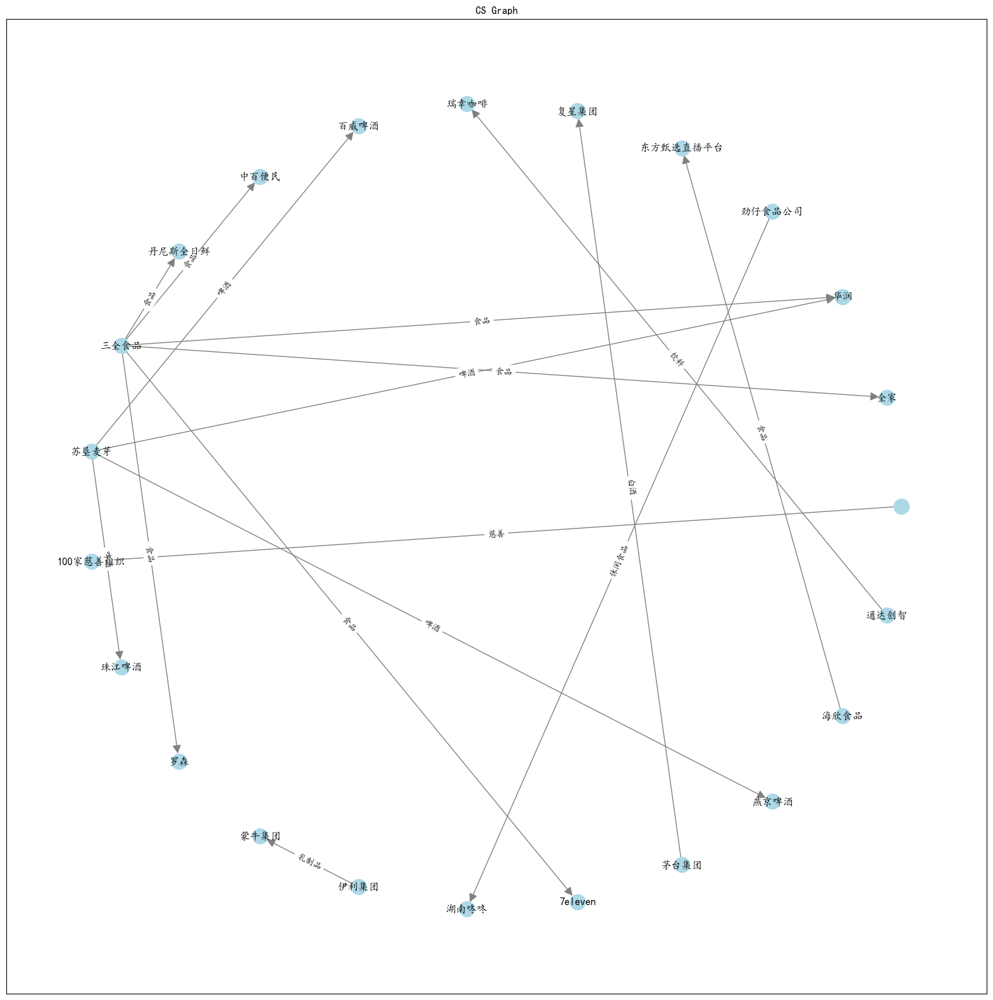

RealEstate


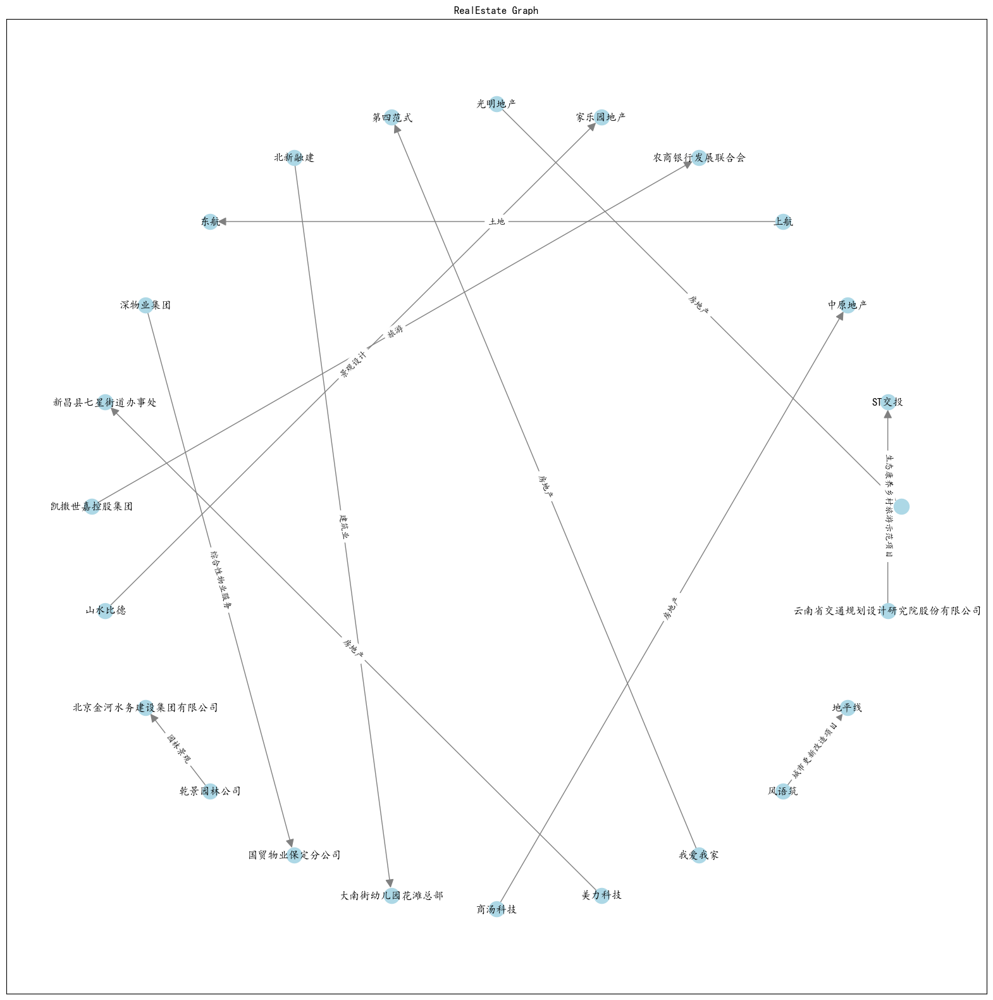

In [153]:
import networkx as nx
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.pyplot as plt
merged_supply_chain_frame["provider"]=merged_supply_chain_frame["provider"].astype("str")
merged_supply_chain_frame["buyer"]=merged_supply_chain_frame["buyer"].astype("str")
for category_ in category:
    print(category_)
    category_df=merged_supply_chain_frame[merged_supply_chain_frame['category']==category_]
    category_df = category_df[(category_df['provider'] != '空') & (category_df['buyer'] != '空')]
    category_df=category_df[~category_df['provider'].str.contains('中游') & ~category_df['provider'].str.contains('下游')&~category_df['provider'].str.contains('上游')]
    category_df=category_df[~category_df['buyer'].str.contains('中游') & ~category_df['buyer'].str.contains('下游')&~category_df['buyer'].str.contains('上游')]
    # 重新索引 DataFrame
    category_df = category_df.reset_index(drop=True)
    plt.rcParams['font.sans-serif'] = ['KaiTi']
    G = nx.DiGraph()
    companies = list(set(category_df['provider']) | set(category_df['buyer']))
    G.add_nodes_from(companies)
    for i, row in category_df.iterrows():
        G.add_edge(row['provider'], row['buyer'], industry=row['industry'])
    # 设置图的尺寸
    plt.figure(figsize=(20, 20))
    plt.title(category_+' Graph')
    # 绘制图
    #pos = nx.spring_layout(G)
    pos = nx.circular_layout(G)
    nx.draw_networkx(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', arrowsize=20)
    # 添加边的标签
    edge_labels = {(u, v): d['industry'] for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
    plt.show()

In [163]:
#画energy，因为公司比较多
for category_ in category[:1]:
    print(category_)
    category_df=merged_supply_chain_frame[merged_supply_chain_frame['category']==category_]
    category_df = category_df[(category_df['provider'] != '空') & (category_df['buyer'] != '空')]
    category_df=category_df[~category_df['provider'].str.contains('中游') & ~category_df['provider'].str.contains('下游')&~category_df['provider'].str.contains('上游')]
    category_df=category_df[~category_df['buyer'].str.contains('中游') & ~category_df['buyer'].str.contains('下游')&~category_df['buyer'].str.contains('上游')]
    # 重新索引 DataFrame
    category_df = category_df.reset_index(drop=True)
    plt.rcParams['font.sans-serif'] = ['KaiTi']
    G = nx.DiGraph()
    companies = list(set(category_df['provider']) | set(category_df['buyer']))
    G.add_nodes_from(companies)
    for i, row in category_df.iterrows():
        G.add_edge(row['provider'], row['buyer'], industry=row['industry'])
    # 设置图的尺寸
    plt.figure(figsize=(200, 200))
    plt.title(category_+' Graph')
    # 绘制图
    #pos = nx.spring_layout(G)
    pos = nx.circular_layout(G)
    nx.draw_networkx(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', arrowsize=20)
    # 添加边的标签
    edge_labels = {(u, v): d['industry'] for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
    path="./output/"+category_+"graph"+ ".png"                           
    plt.savefig(path)
    plt.close()  # 关闭当前图形，不显示在输出中

Energy


C:\Users\10679\AppData\Local\Temp\ipykernel_12292\837660977.py:26: UserWarning: Glyph 220 (\N{LATIN CAPITAL LETTER U WITH DIAERESIS}) missing from current font.
  plt.savefig(path)


#### 有一些行业非常拥挤，Materials，Industrials，IT,其他直接保存，Telecom,Financials,healthcare也有点挤，改图的大为(40,40)

In [164]:
category

['Energy',
 'HealthCare',
 'Materials',
 'Industrials',
 'IT',
 'CD',
 'Financials',
 'Telecom',
 'Unknown',
 'CS',
 'RealEstate']

In [165]:
#画Materials，Industrials，IT，因为公司比较多
for category_ in category[2:5]:
    print(category_)
    category_df=merged_supply_chain_frame[merged_supply_chain_frame['category']==category_]
    category_df = category_df[(category_df['provider'] != '空') & (category_df['buyer'] != '空')]
    category_df=category_df[~category_df['provider'].str.contains('中游') & ~category_df['provider'].str.contains('下游')&~category_df['provider'].str.contains('上游')]
    category_df=category_df[~category_df['buyer'].str.contains('中游') & ~category_df['buyer'].str.contains('下游')&~category_df['buyer'].str.contains('上游')]
    # 重新索引 DataFrame
    category_df = category_df.reset_index(drop=True)
    plt.rcParams['font.sans-serif'] = ['KaiTi']
    G = nx.DiGraph()
    companies = list(set(category_df['provider']) | set(category_df['buyer']))
    G.add_nodes_from(companies)
    for i, row in category_df.iterrows():
        G.add_edge(row['provider'], row['buyer'], industry=row['industry'])
    # 设置图的尺寸
    plt.figure(figsize=(200, 200))
    plt.title(category_+' Graph')
    # 绘制图
    #pos = nx.spring_layout(G)
    pos = nx.circular_layout(G)
    nx.draw_networkx(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', arrowsize=20)
    # 添加边的标签
    edge_labels = {(u, v): d['industry'] for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
    path="./output/"+category_+"graph"+ ".png"                           
    plt.savefig(path)
    plt.close()  # 关闭当前图形，不显示在输出中

Materials


C:\Users\10679\AppData\Local\Temp\ipykernel_12292\851079318.py:27: UserWarning: Glyph 8226 (\N{BULLET}) missing from current font.
  plt.savefig(path)


Industrials
IT


In [167]:
#画Telecom,Financials,healthcare
category_index=[1,6,7]
for index in category_index:
    category_=category[index]
    print(category_)
    category_df=merged_supply_chain_frame[merged_supply_chain_frame['category']==category_]
    category_df = category_df[(category_df['provider'] != '空') & (category_df['buyer'] != '空')]
    category_df=category_df[~category_df['provider'].str.contains('中游') & ~category_df['provider'].str.contains('下游')&~category_df['provider'].str.contains('上游')]
    category_df=category_df[~category_df['buyer'].str.contains('中游') & ~category_df['buyer'].str.contains('下游')&~category_df['buyer'].str.contains('上游')]
    # 重新索引 DataFrame
    category_df = category_df.reset_index(drop=True)
    plt.rcParams['font.sans-serif'] = ['KaiTi']
    G = nx.DiGraph()
    companies = list(set(category_df['provider']) | set(category_df['buyer']))
    G.add_nodes_from(companies)
    for i, row in category_df.iterrows():
        G.add_edge(row['provider'], row['buyer'], industry=row['industry'])
    # 设置图的尺寸
    plt.figure(figsize=(200, 200))
    plt.title(category_+' Graph')
    # 绘制图
    #pos = nx.spring_layout(G)
    pos = nx.circular_layout(G)
    nx.draw_networkx(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', arrowsize=20)
    # 添加边的标签
    edge_labels = {(u, v): d['industry'] for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
    path="./output/"+category_+"graph"+ ".png"                           
    plt.savefig(path)
    plt.close()  # 关闭当前图形，不显示在输出中

HealthCare
Financials
Telecom


In [175]:
#进行图相关性分析
result_df = pd.DataFrame(columns=['Category', 'Max Out Degree', 'Max In Degree', 'Average Out Degree', 'Average In Degree', 'Max Out Degree Companies', 'Max In Degree Companies'])
for category_ in category:
    print(category_)
    category_df=merged_supply_chain_frame[merged_supply_chain_frame['category']==category_]
    category_df = category_df[(category_df['provider'] != '空') & (category_df['buyer'] != '空')]
    category_df=category_df[~category_df['provider'].str.contains('中游') & ~category_df['provider'].str.contains('下游')&~category_df['provider'].str.contains('上游')]
    category_df=category_df[~category_df['buyer'].str.contains('中游') & ~category_df['buyer'].str.contains('下游')&~category_df['buyer'].str.contains('上游')]
    for element in elements_to_remove:
        category_df= category_df.replace(element, '')
    #delete na
    category_df=category_df.dropna()
    category_df=category_df[category_df["provider"]!='']
    category_df=category_df[category_df["buyer"]!='']
    # 重新索引 DataFrame
    category_df = category_df.reset_index(drop=True)
    plt.rcParams['font.sans-serif'] = ['KaiTi']
    G = nx.DiGraph()
    companies = list(set(category_df['provider']) | set(category_df['buyer']))
    G.add_nodes_from(companies)
    for i, row in category_df.iterrows():
        G.add_edge(row['provider'], row['buyer'], industry=row['industry'])
        
    # 计算最大出度和最大入度
    max_out_degree = max(dict(G.out_degree()).values())
    max_in_degree = max(dict(G.in_degree()).values())
    # 计算平均出度和平均入度
    average_out_degree = sum(dict(G.out_degree()).values()) / len(G)
    average_in_degree = sum(dict(G.in_degree()).values()) / len(G)
    """# 计算最长供应链
    longest_path = []
    longest_path_length = 0

    for node in G.nodes():
        paths = nx.all_simple_paths(G, source=node, target=None)
        for path in paths:
            path_length = len(path) - 1  # 减去起始节点
            if path_length > longest_path_length:
                longest_path = path
                longest_path_length = path_length

    # 最长供应链的起始节点即为源节点
    source_node = longest_path[0]"""

    # 计算最大出度公司和最大入度公司
    max_out_degree_companies = [node for node, degree in G.out_degree() if degree == max_out_degree]
    max_in_degree_companies = [node for node, degree in G.in_degree() if degree == max_in_degree]

    # 打印结果
    print("最大出度:", max_out_degree)
    print("最大入度:", max_in_degree)
    print("平均出度:", average_out_degree)
    print("平均入度:", average_in_degree)
    print("最大出度公司:", max_out_degree_companies)
    print("最大入度公司:", max_in_degree_companies)
    result_df = result_df.append({
        'Category': category_,
        'Max Out Degree': max_out_degree,
        'Max In Degree': max_in_degree,
        'Average Out Degree': average_out_degree,
        'Average In Degree': average_in_degree,
        'Max Out Degree Companies': ', '.join(max_out_degree_companies),
        'Max In Degree Companies': ', '.join(max_in_degree_companies)
    }, ignore_index=True)
    result_df.to_csv('./output/graph_degree_analysis_results.csv', encoding="utf_8_sig",index=False)

Energy
最大出度: 12
最大入度: 4
平均出度: 0.6446991404011462
平均入度: 0.6446991404011462
最大出度公司: ['亚普股份']
最大入度公司: ['阿里', '中兴']
HealthCare
最大出度: 2
最大入度: 2
平均出度: 0.5257731958762887
平均入度: 0.5257731958762887
最大出度公司: ['博济医药', '烟台东诚核医疗健康产业集团有限公司']
最大入度公司: ['蓝鹊生物']
Materials
最大出度: 13
最大入度: 8
平均出度: 0.6421052631578947
平均入度: 0.6421052631578947
最大出度公司: ['普利特']
最大入度公司: ['中兴']
Industrials
最大出度: 7
最大入度: 22
平均出度: 0.6817248459958932
平均入度: 0.6817248459958932
最大出度公司: ['汉钟精机', '巨一科技']
最大入度公司: ['中兴']
IT


C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({
C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({
C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({
C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({


最大出度: 17
最大入度: 35
平均出度: 0.7609489051094891
平均入度: 0.7609489051094891
最大出度公司: ['苹果']
最大入度公司: ['中兴']
CD
最大出度: 4
最大入度: 1
平均出度: 0.5714285714285714
平均入度: 0.5714285714285714
最大出度公司: ['中百集团']
最大入度公司: ['华润', '正企良缘', '重庆城投集团巫山城市更新建设发展有限公司', '瑞幸咖啡', '意尔康股份有限公司', '茅台品牌', '上影·联和院线', '中兴', '网易', 'Andor', '饿了么', '人民网旗下平台人民数据', '三六零', '平江县人民政府', '广西石化', '腾讯', '北京华宇九品科技有限公司', '北京华宇信息技术有限公司', 'WCO', '多点', '美团', '怡亚通', '京东', '当当网']
Financials
最大出度: 3
最大入度: 2
平均出度: 0.5490196078431373
平均入度: 0.5490196078431373
最大出度公司: ['东风']
最大入度公司: ['中兴']
Telecom
最大出度: 5
最大入度: 10
平均出度: 0.7777777777777778
平均入度: 0.7777777777777778
最大出度公司: ['中国移动']
最大入度公司: ['中兴']
Unknown
最大出度: 2
最大入度: 1
平均出度: 0.5294117647058824
平均入度: 0.5294117647058824
最大出度公司: ['棕榈股份']
最大入度公司: ['廊坊市第四人民医院', '吉利', '深圳市场', '中文在线', '中信集团', '超图软件', '版权剧、短剧、网剧、网大', '中国农业科学院农田灌溉研究所', '河南省豫资农业服务有限公司']
CS
最大出度: 6
最大入度: 2
平均出度: 0.7142857142857143
平均入度: 0.7142857142857143
最大出度公司: ['三全食品']
最大入度公司: ['华润']
RealEstate
最大出度: 1
最大入度: 1
平均出度: 0.5
平均入度: 0.5
最大出度公司: ['上航', '北新融

C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({
C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({
C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({
C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py:56: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({
C:\Users\10679\AppData\Local\Temp\ipykernel_12292\2218682428.py: